In [1]:
pip install yfinance

     |████████████████████████████████| 62 kB 659 kB/s 
     |████████████████████████████████| 6.4 MB 29.4 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: lxml
    Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [2]:
pip install pyfolio

     |████████████████████████████████| 91 kB 6.8 MB/s 
     |████████████████████████████████| 52 kB 1.2 MB/s 
  Created wheel for pyfolio: filename=pyfolio-0.9.2-py3-none-any.whl size=88681 sha256=eb9df8ad49a20415d3570c9bd6f9e0e096e6c3df53c4190ed67bd4df83692df5
  Stored in directory: /root/.cache/pip/wheels/e4/96/9b/0dfff5453e702fd780a099b7c850521099c5ec0dfafae189f9
  Created wheel for empyrical: filename=empyrical-0.5.5-py3-none-any.whl size=39777 sha256=9896aba7b5f1e8b1e1b5697b4d42e158ba40cf6600b6838ebc37ade275593a91
  Stored in directory: /root/.cache/pip/wheels/d9/91/4b/654fcff57477efcf149eaca236da2fce991526cbab431bf312
Successfully built pyfolio empyrical


In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [4]:
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
import scipy.optimize as sco
#Getting data from yfinance
import yfinance as yf
import pandas as pd
import numpy as np
import pyfolio as pf
plt.style.use('seaborn')
sns.set_palette('cubehelix')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

/usr/local/lib/python3.7/dist-packages/pyfolio/pos.py:27: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  'Module "zipline.assets" not found; mutltipliers will not be applied' +




1.   **Sharpe Ratio:** Measures excess return per unit of std. Greater sharpe ratio better risk adjusted
2.   **Max-Drawdown:** Measures downside risk. Lower is better!!
3.   **Clamar Ratio:** Higher ratio is better
4.   **Tail Ratio:** eg A ratio of 0.8 means losses are 1.25 times as bad as profit



In [5]:

RISKY_ASSETS= ['AAPL','IBM','MSFT','TWTR']
START_DATE= '2012-01-01'
n_assets= len(RISKY_ASSETS)
price_df= yf.download(RISKY_ASSETS,start=START_DATE,adjusted=True)
returns= price_df['Adj Close'].pct_change().dropna()
portfolio_weigths= n_assets * [1/n_assets]
portfolio_returns= pd.Series(np.dot(portfolio_weigths,returns.T), index= returns.index)
pf.create_simple_tear_sheet(portfolio_returns)

[*********************100%***********************]  4 of 4 completed


Start date,2013-11-08
End date,2021-12-31
Total months,97
,Backtest
Annual return,19.6%
Cumulative returns,328.6%
Annual volatility,24.2%
Sharpe ratio,0.86
Calmar ratio,0.54
Stability,0.86
Max drawdown,-36.0%


In [6]:
price_df

Adj Close                          ...   Volume                      
                  AAPL         IBM        MSFT  ...      IBM      MSFT        TWTR
Date                                            ...                               
2012-01-03   12.591938  124.413010   21.667845  ...  5905716  64731500         NaN
2012-01-04   12.659605  123.905495   22.177769  ...  4546648  80516100         NaN
2012-01-05   12.800155  123.317787   22.404406  ...  4668403  56081400         NaN
2012-01-06   12.933967  121.902100   22.752457  ...  5122367  99455500         NaN
2012-01-09   12.913448  121.267632   22.452978  ...  5440455  59706800         NaN
...                ...         ...         ...  ...      ...       ...         ...
2021-12-27  180.330002  131.619995  342.450012  ...  4293900  19947000   8589700.0
2021-12-28  179.289993  132.630005  341.250000  ...  3445200  15661500   8831000.0
2021-12-29  179.380005  133.350006  341.950012  ...  4239900  15042000   8732900.0
2021-12-30  178.199997  133.910004  339.320007  ...  3158100  15994500  14541100.0
2021-12-31  177.570007  133.660004  336.320007  ...  3361700  17986600   9817500.0

[2517 rows x 24 columns]

In [7]:
N_PORTFOLIOS= 10 ** 5
N_DAYS = 252
returns_df= price_df['Adj Close'].pct_change().dropna()
avg_returns = returns_df.mean() * N_DAYS
cov_mat = returns_df.cov() * N_DAYS
#RANDOM WEIGHTS
np.random.seed(42)
weights= np.random.random(size=(N_PORTFOLIOS,n_assets))
weights /= np.sum(weights,axis=1)[:,np.newaxis]
#calculate portfolio metrics
portf_rtns= np.dot(weights,avg_returns)
portf_vol=[]
for i in range(0, len(weights)):
  portf_vol.append(np.sqrt(np.dot(weights[i].T,
                           np.dot(cov_mat,weights[i]))))
portf_vol=np.array(portf_vol)
portf_sharpe_ratio= portf_rtns/portf_vol
portf_results_df= pd.DataFrame({'returns': portf_rtns,
                        'volatility': portf_vol,
                        'sharpe_ratio': portf_sharpe_ratio})
portf_results_df

,returns,volatility,sharpe_ratio
0,0.180871,0.232141,0.779143
1,0.159677,0.399221,0.399972
2,0.160363,0.289398,0.554125
3,0.262340,0.240496,1.090830
4,0.194067,0.225694,0.859869
...,...,...,...
99995,0.167649,0.211245,0.793625
99996,0.206772,0.325122,0.635982
99997,0.215699,0.212195,1.016516
99998,0.228602,0.258077,0.885792


#Monte Carlo Simulation

In [8]:
N_POINTS = 100
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                            portf_results_df.returns.max(), 
                            N_POINTS)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(N_POINTS):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)

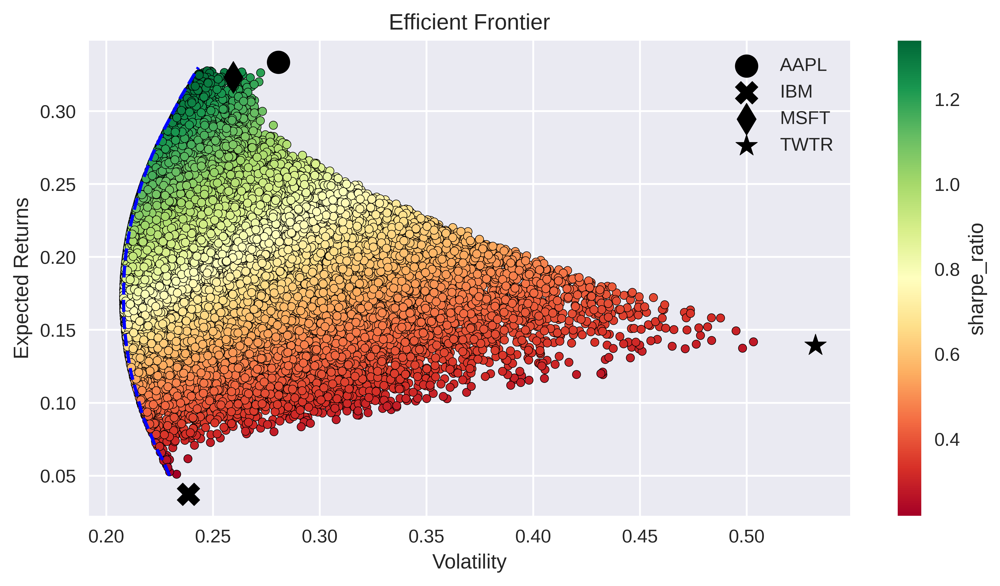

In [10]:
MARKS = ['o', 'X', 'd', '*']

fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=RISKY_ASSETS[asset_index])
ax.legend()

plt.tight_layout()
plt.savefig('/plot1.png')
plt.show()

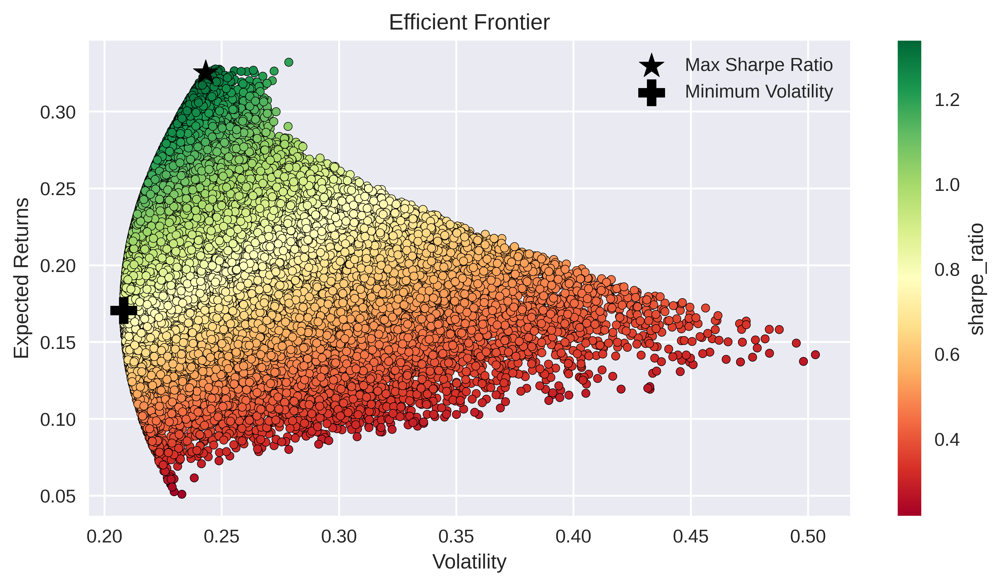

In [12]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf.volatility, 
           y=max_sharpe_portf.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf.volatility, 
           y=min_vol_portf.returns, 
           c='black', marker='P', 
           s=200, label='Minimum Volatility')
ax.set(xlabel='Volatility', ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.legend()

plt.tight_layout()
plt.savefig('plot2.png')
plt.show()

In [14]:
print('Maximum Sharpe Ratio portfolio')
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(RISKY_ASSETS, weights[np.argmax(portf_results_df.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Maximum Sharpe Ratio portfolio
Performance
returns: 32.53% volatility: 24.32% sharpe_ratio: 133.77% 
Weights
AAPL: 42.40% IBM: 0.58% MSFT: 56.68% TWTR: 0.34% 

In [15]:
print('Minimum Volatility portfolio')
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(RISKY_ASSETS, weights[np.argmin(portf_results_df.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio
Performance
returns: 17.06% volatility: 20.81% sharpe_ratio: 81.99% 
Weights
AAPL: 20.41% IBM: 52.48% MSFT: 24.61% TWTR: 2.50% 

#Scipy optimization method

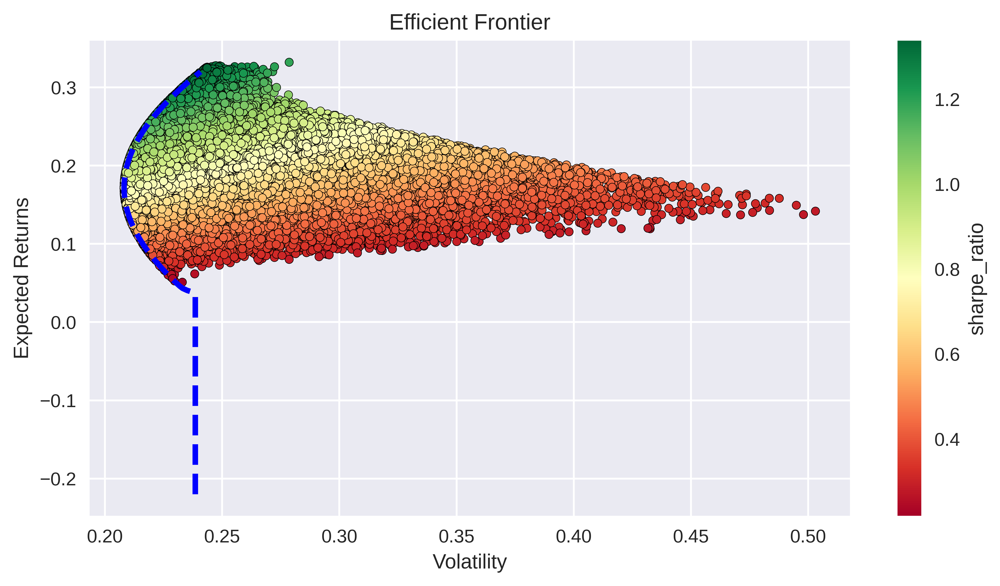

In [16]:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                        'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                       {'type': 'eq', 
                        'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints,
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios
rtns_range = np.linspace(-0.22, 0.32, 200)
efficient_portfolios = get_efficient_frontier(avg_returns, 
                                              cov_mat, 
                                              rtns_range)
vols_range = [x['fun'] for x in efficient_portfolios]
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.plot(vols_range, rtns_range, 'b--', linewidth=3)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')

plt.tight_layout()
plt.savefig('plot3.png')
plt.show()

In [18]:
from tensorflow import keras
from sklearn import metrics

def regression_eval(y_true,y_pred):
    variance_score= metrics.explained_variance_score(y_true, y_pred)
    mse= np.sqrt(metrics.mean_squared_error(y_true, y_pred))
    r2= metrics.r2_score(y_true, y_pred)
    return print(f'Varianace score (Best possible score is 1.0, lower values are worse.) : {variance_score}\nrmse : {mse}\nR2 (Best possible score is 1.0): {r2}')
def get_closevol(df, AddTicker):
  new_df=pd.DataFrame({'Close':df['Close'][AddTicker],'Volume': df['Volume'][AddTicker]})
  return new_df
def trading_window(df):
  n=1 #shift price by 1 day
  df['Target']= df[['Close']].shift(-n)
  return df
from sklearn.preprocessing import MinMaxScaler
df=get_closevol(price_df,'MSFT')
df = df[:-1]
#training data
training_data = df[['Close','Volume']].values
from sklearn.preprocessing import MinMaxScaler
sc= MinMaxScaler(feature_range=(0,1))
training_scaled_data= sc.fit_transform(training_data)
# Create the training and testing data, training data contains present day and previous day values
X = []
y = []
for i in range(1, len(df)):
    X.append(training_scaled_data[i-1:i, 0])
    y.append(training_scaled_data[i, 0])
# Convert the data into array format
X = np.asarray(X)
y = np.asarray(y)
# Split the data
split = int(0.7 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]
# Reshape the 1D arrays to 3D arrays to feed in the model
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
# Create the model
inputs = keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2]))
x = keras.layers.LSTM(150, return_sequences= True)(inputs)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150, return_sequences=True)(x)
x = keras.layers.Dropout(0.3)(x)
x = keras.layers.LSTM(150)(x)
outputs = keras.layers.Dense(1, activation='linear')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss="mse")
# Train the model
history = model.fit(
    X_train, y_train,
    epochs = 20,
    batch_size = 32,
    validation_split = 0.2
)
# Make prediction
test_prediction= model.predict(X_test)
regression_eval(y_test , test_prediction)

Epoch 1/20
44/44 [==============================] - 8s 51ms/step - loss: 0.0019 - val_loss: 0.0233
Epoch 2/20
44/44 [==============================] - 1s 13ms/step - loss: 0.0010 - val_loss: 0.0016
Epoch 3/20
44/44 [==============================] - 1s 13ms/step - loss: 4.8716e-05 - val_loss: 4.1736e-05
Epoch 4/20
44/44 [==============================] - 1s 13ms/step - loss: 2.1707e-05 - val_loss: 4.0219e-05
Epoch 5/20
44/44 [==============================] - 1s 14ms/step - loss: 1.9352e-05 - val_loss: 2.6117e-05
Epoch 6/20
44/44 [==============================] - 1s 14ms/step - loss: 1.7508e-05 - val_loss: 3.5527e-05
Epoch 7/20
44/44 [==============================] - 0s 10ms/step - loss: 1.9502e-05 - val_loss: 5.3078e-05
Epoch 8/20
44/44 [==============================] - 0s 9ms/step - loss: 2.1962e-05 - val_loss: 2.4460e-05
Epoch 9/20
44/44 [==============================] - 0s 9ms/step - loss: 1.9896e-05 - val_loss: 2.4609e-05
Epoch 10/20
44/44 [==============================] - 0s